# Chest X-Ray Images

In [1]:


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)



# Overall Settings

In [2]:
FINE_TUNING_EPOCHS = 5
TRAINING_EPOCHS = 10
BATCH_SIZE = 32

image_height = 300
image_width = 300

# Data Generators

In [3]:
# deep learning libraries
import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import applications
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.preprocessing import image
from tensorflow.keras.utils import image_dataset_from_directory
import matplotlib.pyplot as plt

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [4]:
# Data agumentation and pre-processing using tensorflow
gen = ImageDataGenerator(rescale = 1./255)
 
train_generator = gen.flow_from_directory(
    directory = "/kaggle/input/chest-xray-pneumonia/chest_xray/train", # images data path / folder in which images are there
    color_mode = "rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode = "categorical",
    batch_size = BATCH_SIZE,
    shuffle = True,
    seed = 42)

Found 5216 images belonging to 2 classes.


In [5]:
# Data agumentation and pre-processing using tensorflow
test_gen = ImageDataGenerator(rescale = 1./255.)

validation_generator = test_gen.flow_from_directory(
    directory   = "/kaggle/input/chest-xray-pneumonia/chest_xray/val", # images data path / folder in which images are there
    color_mode  ="rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = True,
    seed        = 42)

test_generator = test_gen.flow_from_directory(
    directory   = "/kaggle/input/chest-xray-pneumonia/chest_xray/test", # images data path / folder in which images are ther
    color_mode  = "rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = False)

Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


In [6]:
# Get labels in dataset
a = train_generator.class_indices
class_names = list(a.keys())  # storing class/breed names in a list

In [7]:
class_names

['NORMAL', 'PNEUMONIA']

In [8]:
freq = np.unique(train_generator.classes, return_counts=True)

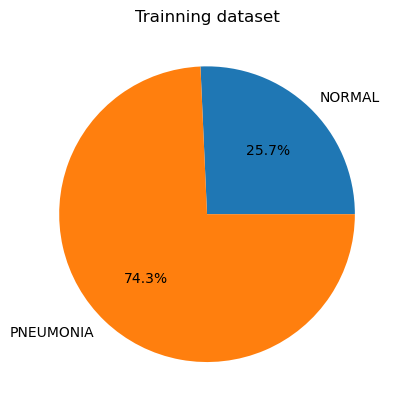

In [9]:
plt.title("Trainning dataset")
plt.pie(freq[1], labels = class_names, autopct='%1.1f%%');

In [10]:
def plot_images(img, true_labels, predictions = None):
    plt.figure(figsize=[12, 18])
    for i in range(24):
        plt.subplot(6, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if (predictions is not None):
            plt.title("{}\n {} {:.1f}%".format(class_names[np.argmax(true_labels[i])], class_names[np.argmax(predictions[i])], 100 * np.max(predictions[i])))
        else:
            plt.title(class_names[np.argmax(true_labels[i])])    

# Sample Images

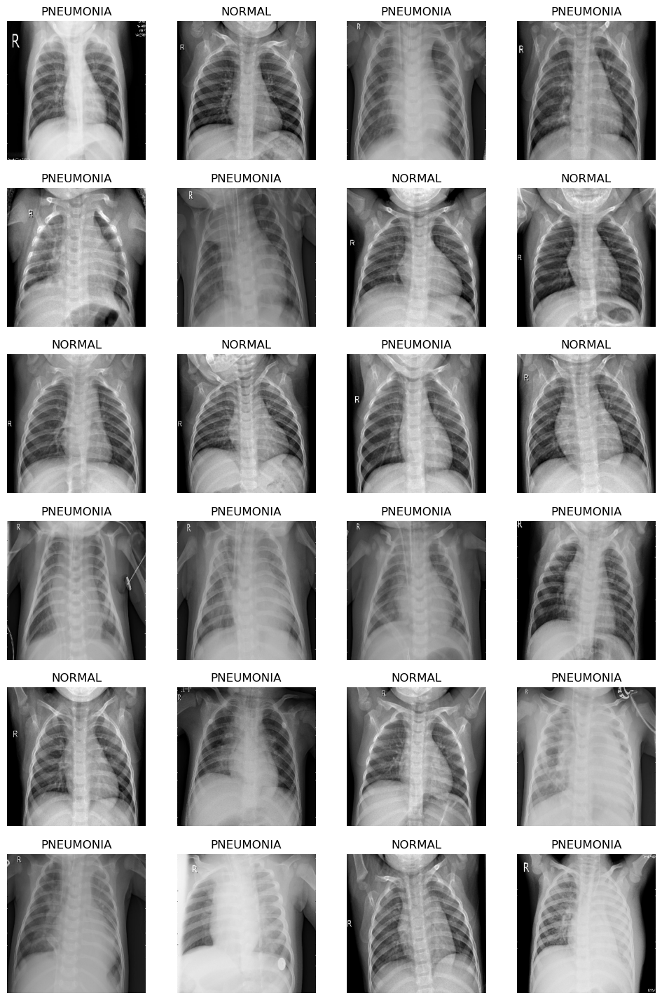

In [11]:
x,y = next(train_generator)
plot_images(x,y)

In [12]:
# function to plote training history
def plot_history(history):
    # store results
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # plot results
    # accuracy
    plt.figure(figsize=(5, 8))
    plt.rcParams['figure.figsize'] = [8, 4]
    plt.rcParams['font.size'] = 10
    plt.rcParams['axes.grid'] = True
    plt.rcParams['figure.facecolor'] = 'white'
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(round(acc[-1],3))}\nValidation Accuracy: {str(round(val_acc[-1],3))}')
    
    # loss
    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    plt.title(f'Training and Validation Loss. \nTrain Loss: {str(round(loss[-1],3))}\nValidation Loss: {str(round(val_loss[-1],3))}')
    plt.xlabel('epoch')
    plt.tight_layout(pad=3.0)
    plt.show()

In [13]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_heatmap(y_true, y_pred, class_names, ax, title):
    cm = confusion_matrix(y_true, y_pred)
    
    sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
    specificity = cm[0,0]/(cm[0,0]+cm[0,1])
    
    new_title = f'{title}\n Sensitivity = {sensitivity:.2f} Specificity = {specificity:.2f}'
    
    sns.heatmap(
        cm, 
        annot=True, 
        square=True, 
        xticklabels=class_names, 
        yticklabels=class_names,
        fmt='d', 
        cmap=plt.cm.Blues,
        cbar=False,
        ax=ax)
    
    ax.set_title(new_title, fontsize = 12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = "right")
    ax.set_ylabel('True Label', fontsize= 10)
    ax.set_xlabel('Predicted Label', fontsize = 10)

# Grad-Cam

In [14]:
from matplotlib import cm

def make_gradcam_heatmap(image, model, last_conv_layer_name):
 
    img_array = tf.expand_dims(image, axis=0)
    
    # Remove last layer's softmax
    last_layer_activation = model.layers[-1].activation
    model.layers[-1].activation = None

    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

 
    grads = tape.gradient(class_channel, last_conv_layer_output)


    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()  
    
    
     # We rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # We use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # We use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # We create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array[0].shape[1], img_array[0].shape[0]))
    jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.4 + img_array[0] * 255 

    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)
    
    # Restore last layer activation
    model.layers[-1].activation = last_layer_activation
    
    return superimposed_img

# Model

In [15]:
from tensorflow.keras.models import Model

def create_model(base_model):
    
    x = base_model.output    
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation = 'relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(64, activation = 'relu')(x)
    x = Dropout(0.2)(x)
    
    outputs = Dense(len(class_names), activation='softmax')(x)
    
    model = Model(base_model.inputs, outputs)
    
    return model  

In [16]:
def fit_model(model, base_model, epochs, fine_tune = 0):
    
    early = tf.keras.callbacks.EarlyStopping( patience = 10,
                                              min_delta = 0.001,
                                              restore_best_weights = True)
    
    print("Unfreezing number of layers in base model = ", fine_tune)
    
    if fine_tune > 0:
        base_model.trainable = True
        for layer in base_model.layers[:-fine_tune]:
            layer.trainable = False       
        # small learning rate for fine tuning
        model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    else:
        base_model.trainable = False
        model.compile(optimizer=tf.keras.optimizers.Adam(),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
       

    # fit model
    history = model.fit(train_generator,
                        validation_data = validation_generator,
                        epochs = epochs,
                        callbacks = [early])
    
    return history

# Inception

In [17]:
# load the InceptionResNetV2 architecture with imagenet weights as base
inception_base_model = tf.keras.applications.InceptionResNetV2(
                     include_top = False,
                     weights = 'imagenet',
                     input_shape = (image_height, image_width, 3)
                     )

inception_model = create_model(inception_base_model)
#inception_model.summary()
history = fit_model(inception_model, inception_base_model, epochs = TRAINING_EPOCHS)

219055592/219055592 [==============================] - 1s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/10
163/163 [==============================] - 116s 600ms/step - loss: 0.2790 - accuracy: 0.8786 - val_loss: 0.4059 - val_accuracy: 0.8750
Epoch 2/10
163/163 [==============================] - 64s 392ms/step - loss: 0.1851 - accuracy: 0.9300 - val_loss: 0.6398 - val_accuracy: 0.6250
Epoch 3/10
163/163 [==============================] - 63s 388ms/step - loss: 0.1647 - accuracy: 0.9388 - val_loss: 0.3431 - val_accuracy: 0.8750
Epoch 4/10
163/163 [==============================] - 63s 389ms/step - loss: 0.1582 - accuracy: 0.9423 - val_loss: 0.4884 - val_accuracy: 0.8125
Epoch 5/10
163/163 [==============================] - 63s 383ms/step - loss: 0.1472 - accuracy: 0.9459 - val_loss: 0.3512 - val_accuracy: 0.8750
Epoch 6/10
163/163 [==============================] - 64s 389ms/step - loss: 0.1350 - accuracy: 0.9498 - val_loss: 0.2629 - val_accuracy: 0.8750
Epoch 7/10
163/

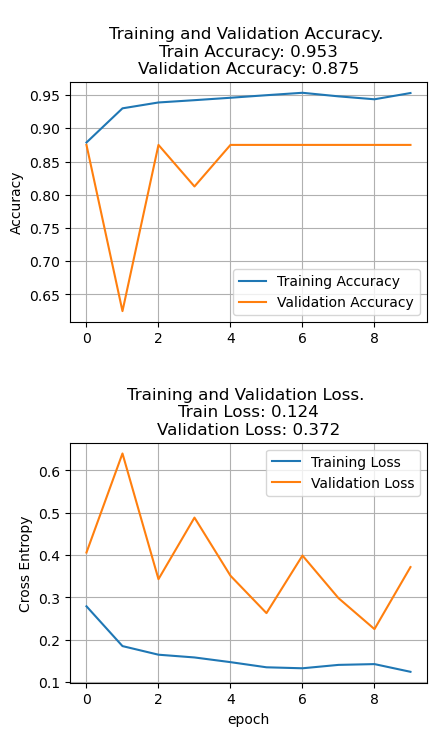

In [18]:
plot_history(history)

In [19]:
# Unfreeze the base_model
nr_base_layers = len(inception_base_model.layers)
print("Inception base layers = ", nr_base_layers)    

history = fit_model(inception_model, inception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

Inception base layers =  780
Unfreezing number of layers in base model =  195
Epoch 1/5
163/163 [==============================] - 104s 433ms/step - loss: 0.1801 - accuracy: 0.9296 - val_loss: 0.7117 - val_accuracy: 0.8125
Epoch 2/5
163/163 [==============================] - 69s 419ms/step - loss: 0.0834 - accuracy: 0.9739 - val_loss: 0.4838 - val_accuracy: 0.8125
Epoch 3/5
163/163 [==============================] - 67s 408ms/step - loss: 0.0464 - accuracy: 0.9879 - val_loss: 0.5021 - val_accuracy: 0.8125
Epoch 4/5
163/163 [==============================] - 66s 404ms/step - loss: 0.0309 - accuracy: 0.9919 - val_loss: 0.4958 - val_accuracy: 0.8125
Epoch 5/5
163/163 [==============================] - 66s 406ms/step - loss: 0.0201 - accuracy: 0.9975 - val_loss: 0.6787 - val_accuracy: 0.8125


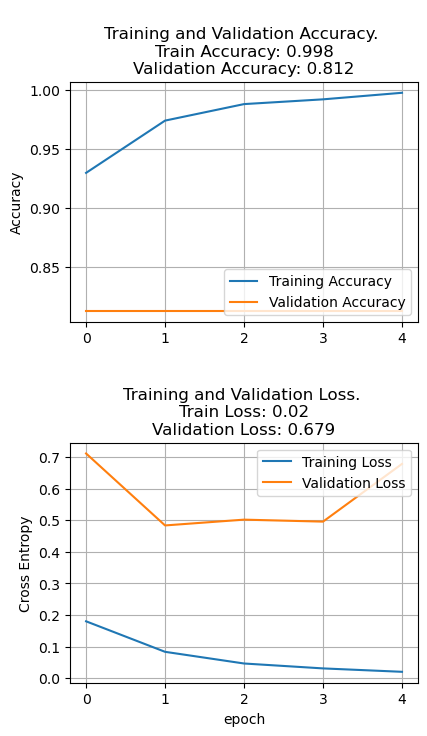

In [20]:
 plot_history(history)

In [21]:
accuracy_score = inception_model.evaluate(test_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

20/20 [==============================] - 9s 432ms/step - loss: 0.9321 - accuracy: 0.8061
[0.9321215748786926, 0.8060897588729858]
Accuracy: 80.61%
Loss: 0.932


In [22]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()
inception_test_preds = inception_model.predict(test_generator)
inception_test_pred_classes = np.argmax(inception_test_preds, axis=1)

20/20 [==============================] - 11s 353ms/step


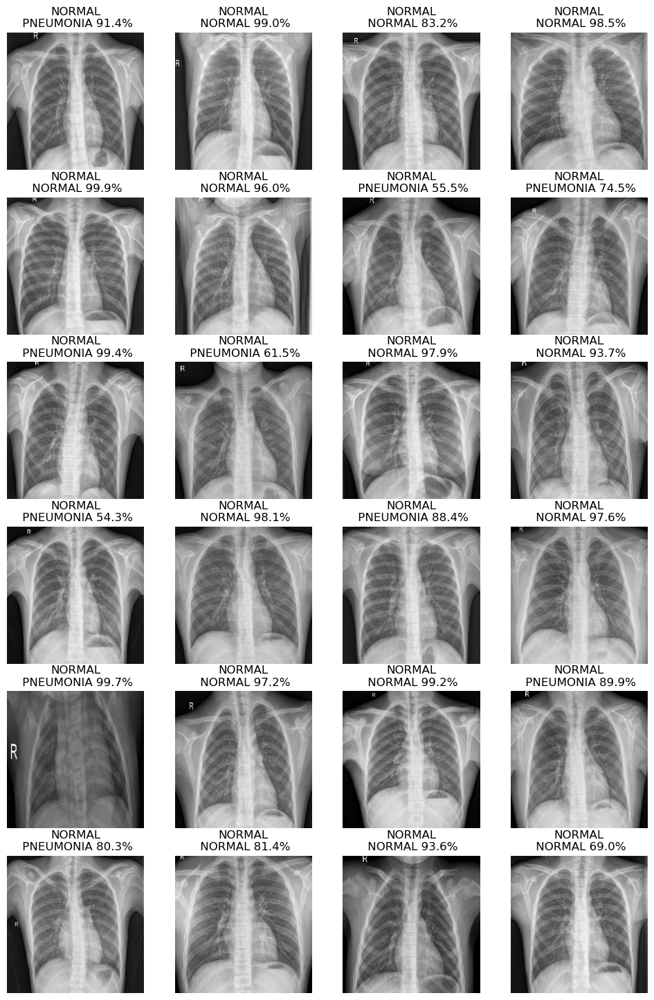

In [23]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, inception_test_preds)

/tmp/ipykernel_28/546683909.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


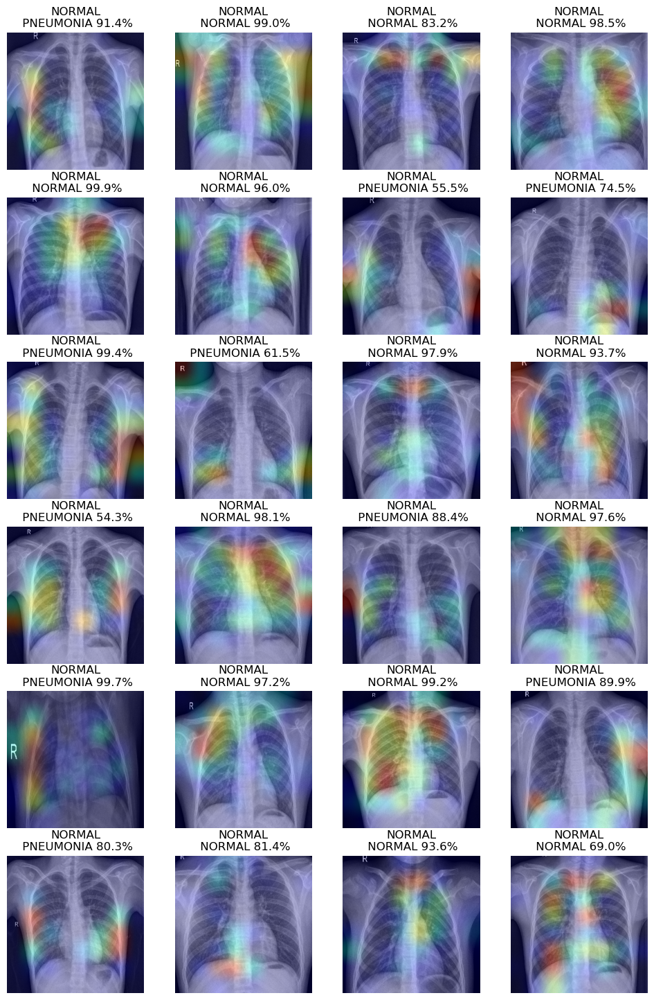

In [24]:
last_conv_layer_name = "conv_7b_ac"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, inception_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, inception_test_preds)

# VGG16

In [25]:
# load the VGG16 architecture with imagenet weights as base
vgg16_base_model = tf.keras.applications.vgg16.VGG16(
                             include_top = False,
                             weights = 'imagenet',
                             input_shape = (image_height, image_width, 3)
                             )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
vgg16_model = create_model(vgg16_base_model)
#vgg16_model.summary()
history = fit_model(vgg16_model, vgg16_base_model, epochs = TRAINING_EPOCHS)

58889256/58889256 [==============================] - 0s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/10
163/163 [==============================] - 68s 384ms/step - loss: 0.3511 - accuracy: 0.8441 - val_loss: 0.4858 - val_accuracy: 0.8125
Epoch 2/10
163/163 [==============================] - 60s 370ms/step - loss: 0.2125 - accuracy: 0.9116 - val_loss: 0.6922 - val_accuracy: 0.6875
Epoch 3/10
163/163 [==============================] - 61s 375ms/step - loss: 0.1707 - accuracy: 0.9323 - val_loss: 0.9778 - val_accuracy: 0.6250
Epoch 4/10
163/163 [==============================] - 61s 374ms/step - loss: 0.1475 - accuracy: 0.9431 - val_loss: 0.9731 - val_accuracy: 0.6250
Epoch 5/10
163/163 [==============================] - 62s 378ms/step - loss: 0.1371 - accuracy: 0.9482 - val_loss: 0.3471 - val_accuracy: 0.8750
Epoch 6/10
163/163 [==============================] - 60s 365ms/step - loss: 0.1257 - accuracy: 0.9536 - val_loss: 0.6645 - val_accuracy: 0.8125
Epoch 7/10
163/163

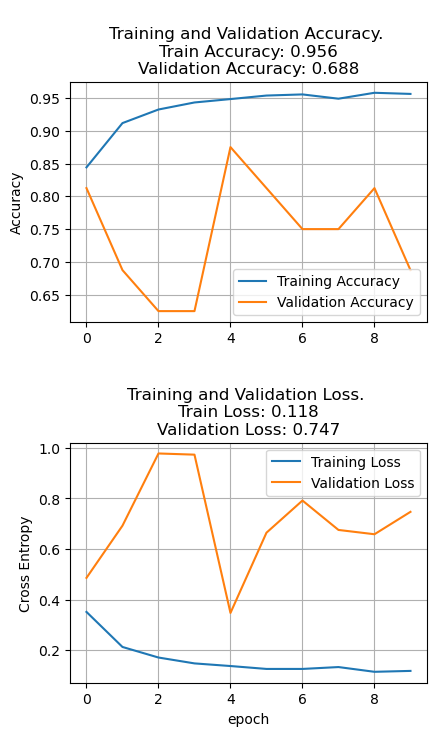

In [26]:
plot_history(history)

In [27]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
nr_base_layers = len(vgg16_base_model.layers)
print("VGG16 base layers = ", nr_base_layers)    

history = fit_model(vgg16_model, vgg16_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

VGG16 base layers =  19
Unfreezing number of layers in base model =  4
Epoch 1/5
163/163 [==============================] - 63s 371ms/step - loss: 0.0863 - accuracy: 0.9695 - val_loss: 0.4832 - val_accuracy: 0.8125
Epoch 2/5
163/163 [==============================] - 57s 349ms/step - loss: 0.0558 - accuracy: 0.9835 - val_loss: 0.1907 - val_accuracy: 0.9375
Epoch 3/5
163/163 [==============================] - 61s 372ms/step - loss: 0.0434 - accuracy: 0.9847 - val_loss: 0.2351 - val_accuracy: 0.9375
Epoch 4/5
163/163 [==============================] - 61s 372ms/step - loss: 0.0262 - accuracy: 0.9910 - val_loss: 0.0582 - val_accuracy: 0.9375
Epoch 5/5
163/163 [==============================] - 61s 374ms/step - loss: 0.0147 - accuracy: 0.9958 - val_loss: 0.2788 - val_accuracy: 0.8750


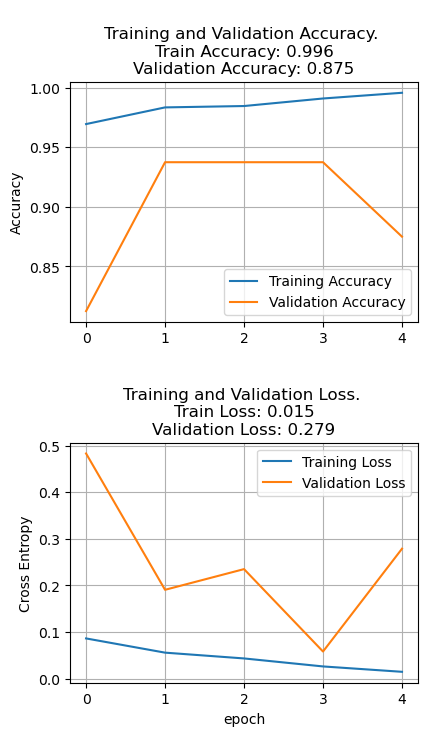

In [28]:
plot_history(history)

In [29]:
accuracy_score = vgg16_model.evaluate(test_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

20/20 [==============================] - 7s 328ms/step - loss: 1.3060 - accuracy: 0.7596
[1.3059804439544678, 0.7596153616905212]
Accuracy: 75.96%
Loss: 1.306


In [30]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()

vgg16_test_preds = vgg16_model.predict(test_generator)
vgg16_test_pred_classes = np.argmax(vgg16_test_preds, axis=1)

20/20 [==============================] - 7s 308ms/step


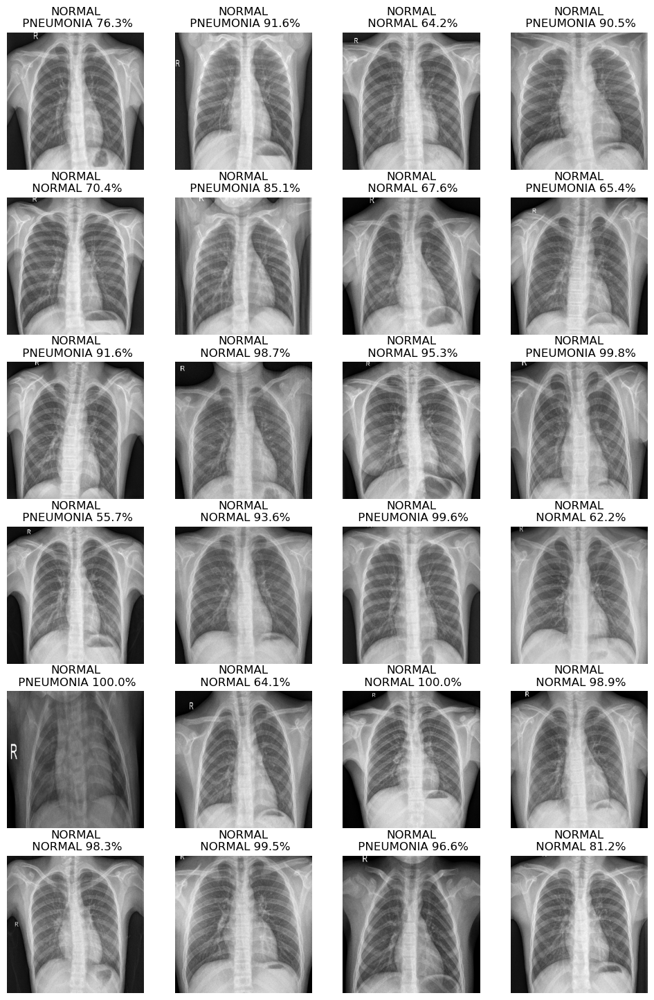

In [31]:
test_generator.reset()
x,y = next(test_generator)
plot_images(x, y, vgg16_test_preds)

/tmp/ipykernel_28/546683909.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


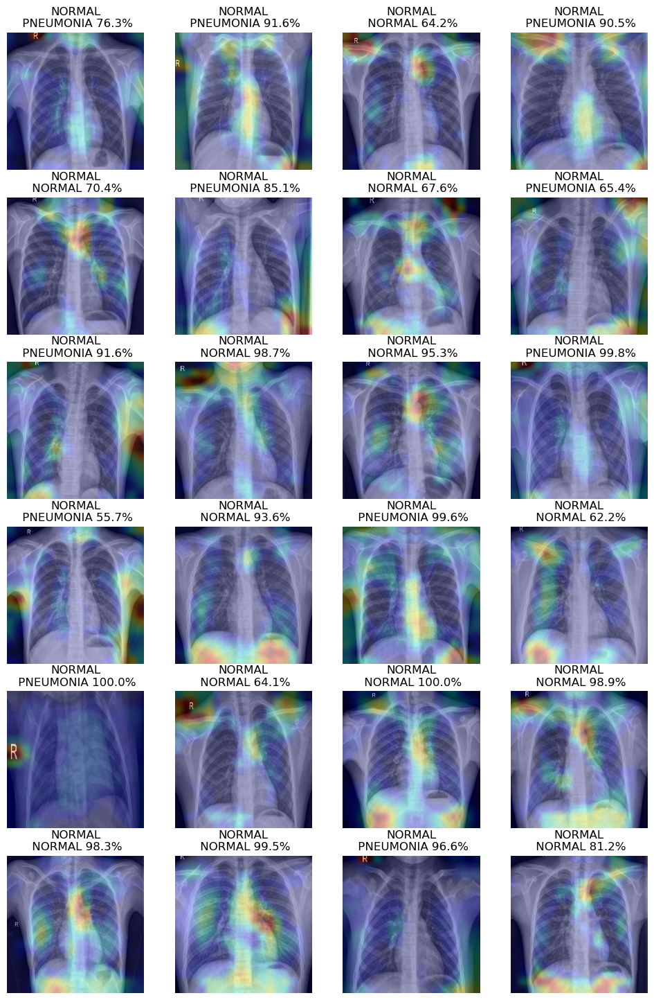

In [32]:
last_conv_layer_name = "block5_conv3"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, vgg16_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, vgg16_test_preds)

# Xception

In [33]:
# load the xception architecture with imagenet weights as base
xception_base_model = tf.keras.applications.xception.Xception(
                                 include_top = False,
                                 weights = 'imagenet',
                                 input_shape = (image_height, image_width, 3)
                                 )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
xception_model = create_model(xception_base_model)
#xception_model.summary()
history = fit_model(xception_model, xception_base_model, epochs = TRAINING_EPOCHS)

83683744/83683744 [==============================] - 0s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/10
163/163 [==============================] - 67s 382ms/step - loss: 0.1890 - accuracy: 0.9225 - val_loss: 0.0875 - val_accuracy: 1.0000
Epoch 2/10
163/163 [==============================] - 61s 373ms/step - loss: 0.1192 - accuracy: 0.9549 - val_loss: 0.1858 - val_accuracy: 0.9375
Epoch 3/10
163/163 [==============================] - 61s 376ms/step - loss: 0.1003 - accuracy: 0.9640 - val_loss: 0.3457 - val_accuracy: 0.8125
Epoch 4/10
163/163 [==============================] - 61s 373ms/step - loss: 0.0978 - accuracy: 0.9630 - val_loss: 0.1677 - val_accuracy: 0.9375
Epoch 5/10
163/163 [==============================] - 60s 367ms/step - loss: 0.0865 - accuracy: 0.9668 - val_loss: 0.1241 - val_accuracy: 1.0000
Epoch 6/10
163/163 [==============================] - 61s 372ms/step - loss: 0.0776 - accuracy: 0.9726 - val_loss: 0.0889 - val_accuracy: 1.0000
Epoch 7/10
163/163

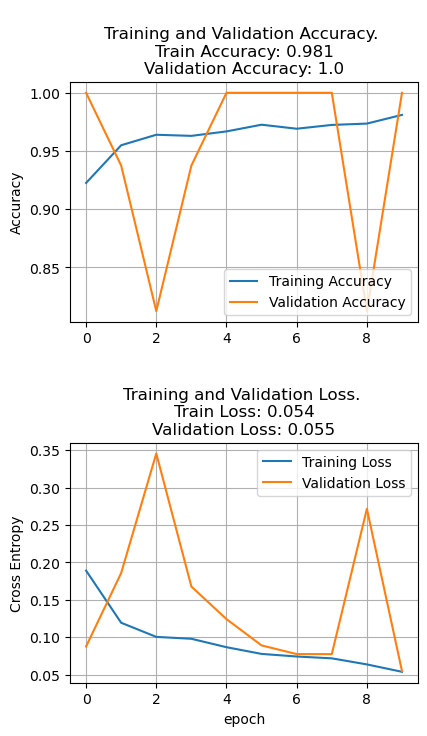

In [34]:
plot_history(history)

In [35]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
nr_base_layers = len(xception_base_model.layers)
print("xception base layers = ", nr_base_layers)    

history = fit_model(xception_model, xception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

xception base layers =  132
Unfreezing number of layers in base model =  33
Epoch 1/5
163/163 [==============================] - 76s 395ms/step - loss: 0.1578 - accuracy: 0.9548 - val_loss: 0.1176 - val_accuracy: 0.9375
Epoch 2/5
163/163 [==============================] - 63s 385ms/step - loss: 0.0895 - accuracy: 0.9714 - val_loss: 0.0429 - val_accuracy: 1.0000
Epoch 3/5
163/163 [==============================] - 63s 389ms/step - loss: 0.0566 - accuracy: 0.9803 - val_loss: 0.0412 - val_accuracy: 1.0000
Epoch 4/5
163/163 [==============================] - 64s 389ms/step - loss: 0.0343 - accuracy: 0.9881 - val_loss: 0.0366 - val_accuracy: 1.0000
Epoch 5/5
163/163 [==============================] - 64s 390ms/step - loss: 0.0420 - accuracy: 0.9854 - val_loss: 0.0286 - val_accuracy: 1.0000


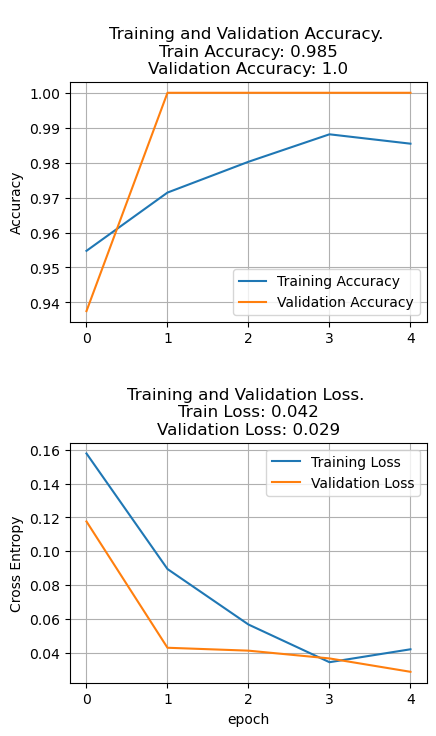

In [36]:
plot_history(history)

In [37]:
accuracy_score = xception_model.evaluate(test_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

20/20 [==============================] - 7s 352ms/step - loss: 0.9093 - accuracy: 0.8381
[0.9092606902122498, 0.8381410241127014]
Accuracy: 83.81%
Loss: 0.909


In [38]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()

xception_test_preds = xception_model.predict(test_generator)
xception_test_pred_classes = np.argmax(xception_test_preds, axis = 1)

20/20 [==============================] - 7s 316ms/step


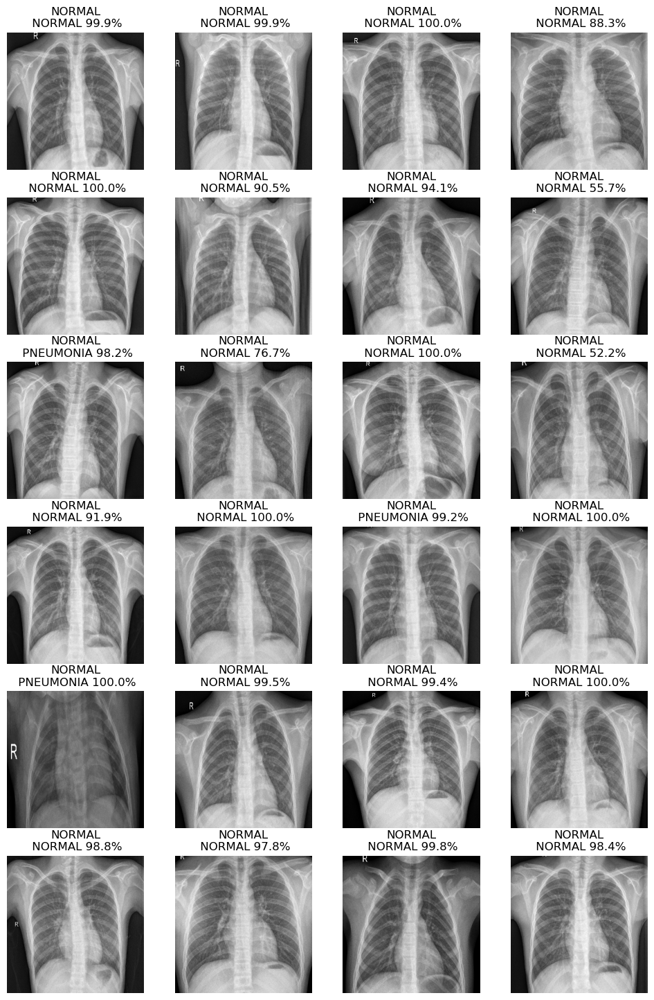

In [39]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, xception_test_preds)

/tmp/ipykernel_28/546683909.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


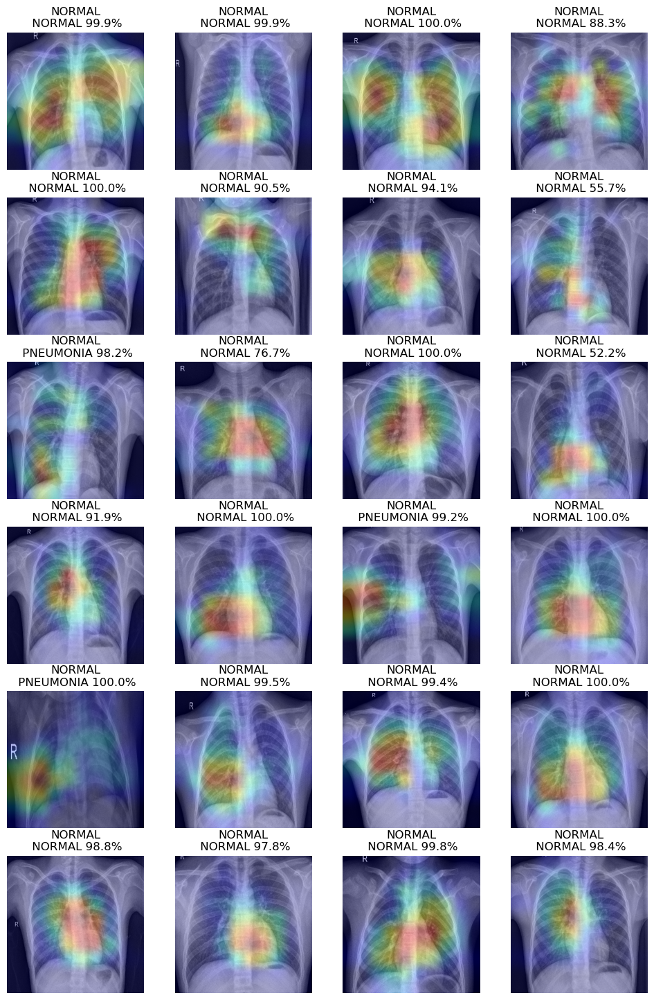

In [40]:
last_conv_layer_name = "block14_sepconv2_act"

heatmaps = []

for img in x:
    heatmap = make_gradcam_heatmap(img, xception_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, xception_test_preds)

# Confusion Matrix

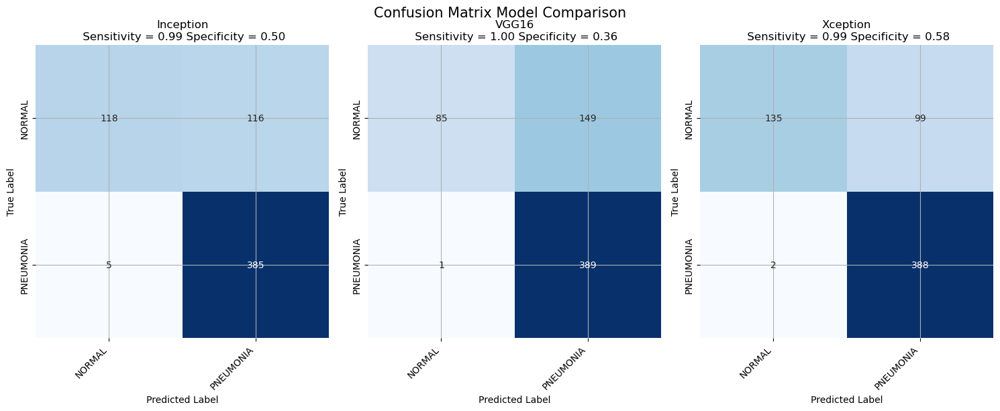

In [41]:
# Display confusion matrix
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 8))

true_classes = test_generator.classes

plot_heatmap(true_classes, inception_test_pred_classes, class_names, ax1, title = "Inception")    
plot_heatmap(true_classes, vgg16_test_pred_classes, class_names, ax2, title = "VGG16")    
plot_heatmap(true_classes, xception_test_pred_classes, class_names, ax3, title = "Xception")    

fig.suptitle("Confusion Matrix Model Comparison", fontsize = 15)
fig.tight_layout()
fig.subplots_adjust(top=1.25)
plt.show()

# Ensemble

In [42]:
ensemble_preds = np.add(np.add(inception_test_preds, vgg16_test_preds), xception_test_preds)/3.0

In [43]:
ensemble_test_pred_classes = np.argmax(ensemble_preds, axis = 1)

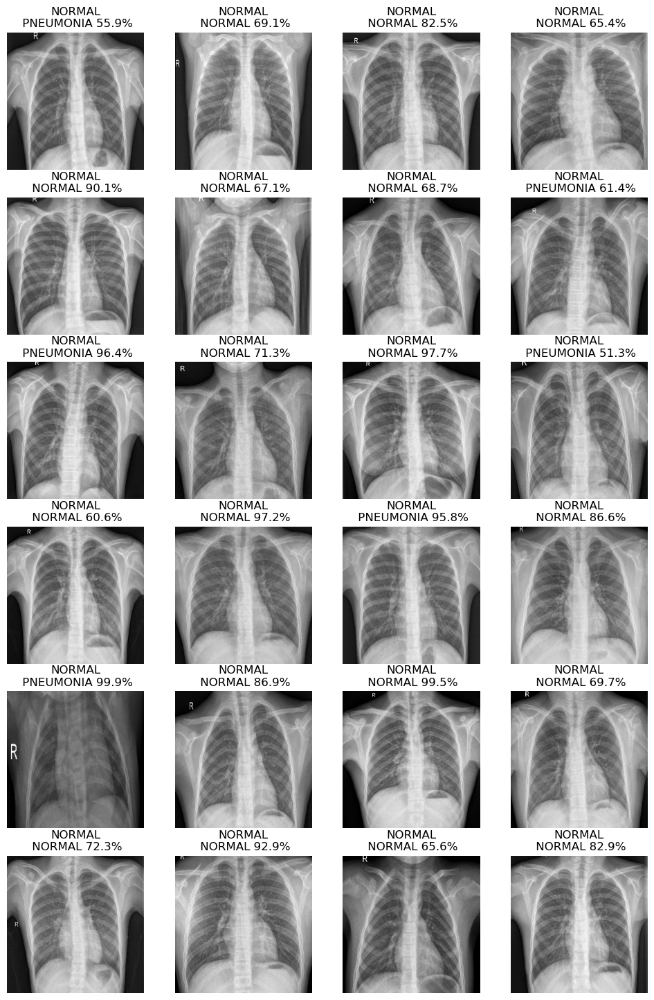

In [44]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, ensemble_preds)

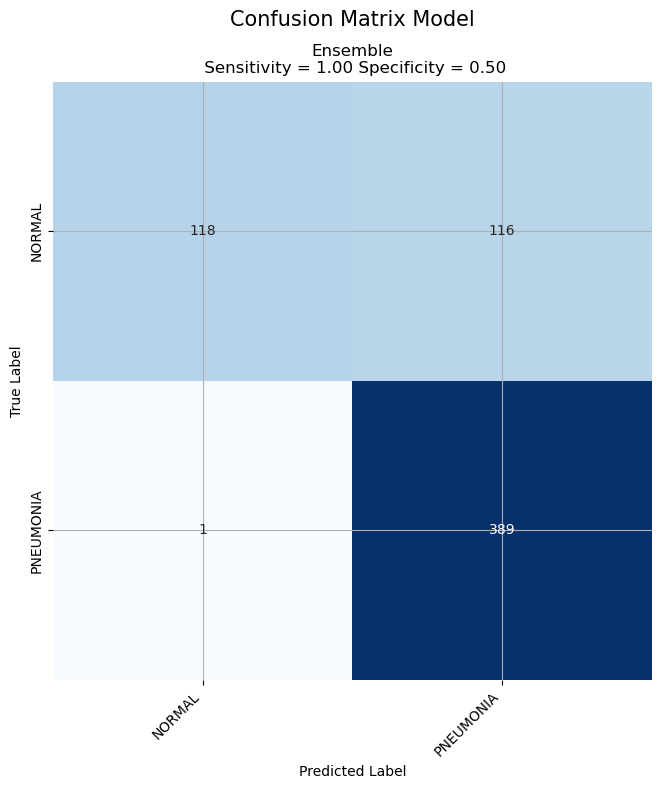

In [45]:
# Display confusion matrix
fig, (ax1) = plt.subplots(1, 1, figsize=(15, 8))

true_classes = test_generator.classes

plot_heatmap(true_classes, ensemble_test_pred_classes, class_names, ax1, title = "Ensemble")        

fig.suptitle("Confusion Matrix Model", fontsize = 15)
fig.tight_layout()
plt.show()